In [1]:
# Only flag for single warning if there are repeats
import warnings
warnings.filterwarnings(action='once')

from panel_segmentation import utils
import glob
import matplotlib.pyplot as plt
from PIL import Image
import os
from shapely.geometry import Polygon
import geopandas
from mmengine import Config
from mmdet.apis import init_detector, inference_detector
from mmdet.registry import VISUALIZERS
from shapely.geometry import Polygon
import mmcv
import numpy as np
import pandas as pd
import torch

# Run a system through the Hail Detection Pipeline

First, let's pull some example images down from the hail data examples folder. This data is taken from a November 2023 scan of Austin, TX.

In [2]:
example_images = glob.glob("./panel_segmentation/examples/austin_hail_data_examples/*.png")

Let's visualize some of the images beforehand. Several of these images contain PV installations that have visible hail damage.

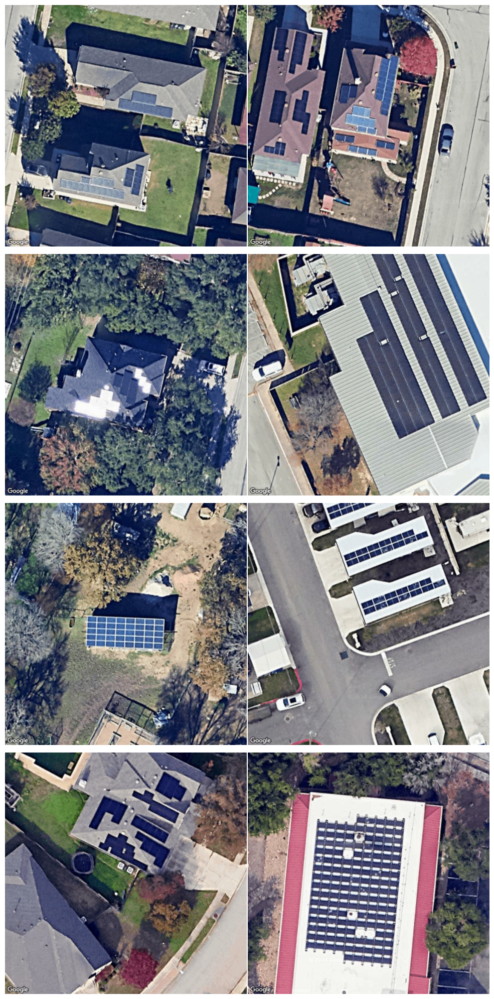

In [3]:
fig, axes = plt.subplots(4, 2, figsize=(10, 20))
axes = axes.ravel()  
for i, image_file in enumerate(example_images):
    img = Image.open(image_file)
    axes[i].imshow(img)
    axes[i].axis('off')
plt.tight_layout()
plt.show()

Let's load in the hail model.

In [4]:
cfg = Config.fromfile("./panel_segmentation/models/hail_config.py")
checkpoint_file = "./panel_segmentation/models/hail_model.pth"
model = init_detector(cfg, device='cpu')
checkpoint = torch.load(checkpoint_file, map_location='cpu', weights_only=False)
model.load_state_dict(checkpoint['state_dict'])
visualizer = VISUALIZERS.build(model.cfg.visualizer)

C:\Users\Quyen\Documents\all_venv\panel_seg_extreme_weather\Lib\site-packages\mmcv\cnn\bricks\transformer.py:24: ImportWarning: ``MultiScaleDeformableAttention`` has been moved to ``mmcv.ops.multi_scale_deform_attn``, please change original path ``from mmcv.cnn.bricks.transformer import MultiScaleDeformableAttention`` to ``from mmcv.ops.multi_scale_deform_attn import MultiScaleDeformableAttention`` 
  warnings.warn(
C:\Users\Quyen\Documents\all_venv\panel_seg_extreme_weather\Lib\site-packages\mmdet\apis\inference.py:70: UserWarning: checkpoint is None, use COCO classes by default.
  warnings.warn('checkpoint is None, use COCO classes by default.')


Next, lets run these images through the hail detection algorithms, and visualize our mask outputs.

C:\Users\Quyen\Documents\all_venv\panel_seg_extreme_weather\Lib\site-packages\mmdet\models\layers\se_layer.py:158: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):
C:\Users\Quyen\Documents\all_venv\panel_seg_extreme_weather\Lib\site-packages\mmdet\models\backbones\csp_darknet.py:118: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):
C:\Users\Quyen\Documents\all_venv\panel_seg_extreme_weather\Lib\site-packages\torch\functional.py:554: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\native\TensorShape.cpp:4316.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
C:\Users\Quyen\Documents\all_

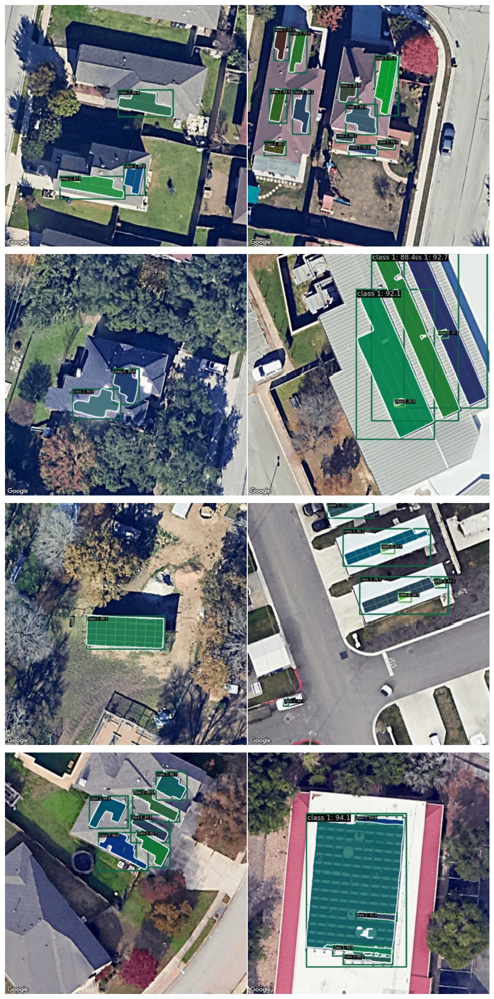

In [5]:
fig, axes = plt.subplots(4, 2, figsize=(10, 20))
axes = axes.ravel()  

# Run inference on all of the example images
inference_data_list = list()
results = list()
for i, file in enumerate(example_images):
    img = mmcv.imread(file, channel_order='rgb')
    new_result = inference_detector(model, img)
    visualizer.add_datasample(
          file,
          img,
          data_sample=new_result,
          draw_gt=None,
          wait_time=0,
          pred_score_thr=0.35
          )
    img = visualizer.get_image()
    axes[i].imshow(img)
    axes[i].axis('off')
    new_result.file = file
    results.append(new_result)
plt.tight_layout()
plt.show()

Let's calculate the percentage of hail damage by PV installation. 

In [6]:
inference_data_list = list()
for result in results:
    predictions = result._pred_instances
    masks = predictions.masks
    labels = predictions.labels
    scores = predictions.scores
    # Take all labels meeting a 0.3 threshold or greater
    idx_to_keep = np.argwhere(scores>=0.3).tolist()[0]
    file_name = os.path.basename(result.file)
    img_center_lat, img_center_lon = float(file_name.split("_")[0]), float(file_name.split("_")[-1].replace(".png", ""))
    image_x_pixels, image_y_pixels = new_result.img_shape
    # Convert all of the masks to latitude-longitude-based polygons
    for index in range(len(masks)):
            if index in idx_to_keep:
                segmentation_mask = masks[index].data.cpu().numpy()
                # Convert the mask to a polygon
                polygon_lat_lon_coords = utils.convertMaskToLatLonPolygon(segmentation_mask, 
                                                                    img_center_lat, 
                                                                    img_center_lon,
                                                                    image_x_pixels, 
                                                                    image_y_pixels,
                                                                    zoom_level=21)
                # Convert to a geoJSON
                shapely_poly = Polygon(polygon_lat_lon_coords)
                geojson_poly = geopandas.GeoSeries(shapely_poly).to_json()
                inference_data_list.append({"image": result.file,
                                            "poly": shapely_poly,
                                            "poly_centroid_lon": shapely_poly.centroid.x,
                                            "poly_centroid_lat": shapely_poly.centroid.y,
                                            "area": shapely_poly.area,
                                            "label": int(labels[index])})
inference_df = pd.DataFrame(inference_data_list)
inference_df.head(10)

,image,poly,poly_centroid_lon,poly_centroid_lat,area,label
0,./panel_segmentation/examples/austin_hail_data...,POLYGON ((-97.74103527554185 30.14786232331778...,-97.741012,30.147838,2.743164e-09,1
1,./panel_segmentation/examples/austin_hail_data...,POLYGON ((-97.74102907576999 30.14773298567980...,-97.741033,30.147706,1.364830e-09,1
2,./panel_segmentation/examples/austin_hail_data...,POLYGON ((-97.74111664754747 30.14771087095414...,-97.741116,30.147692,2.948044e-09,1
3,./panel_segmentation/examples/austin_hail_data...,POLYGON ((-97.74258986801313 30.14777252412872...,-97.742590,30.147760,6.852716e-10,1
4,./panel_segmentation/examples/austin_hail_data...,POLYGON ((-97.74253407006641 30.14786299346098...,-97.742537,30.147825,1.482202e-09,1
5,./panel_segmentation/examples/austin_hail_data...,POLYGON ((-97.74242867394484 30.14783685787610...,-97.742414,30.147811,2.030107e-09,1
6,./panel_segmentation/examples/austin_hail_data...,POLYGON ((-97.74245347303227 30.14787505603861...,-97.742444,30.147860,9.361137e-10,1
7,./panel_segmentation/examples/austin_hail_data...,POLYGON ((-97.74259064298461 30.14786366360418...,-97.742587,30.147835,1.283034e-09,1
8,./panel_segmentation/examples/austin_hail_data...,POLYGON ((-97.74237907576999 30.14777587484473...,-97.742366,30.147767,4.411809e-10,1
9,./panel_segmentation/examples/austin_hail_data...,POLYGON ((-97.74258444321276 30.14797356708930...,-97.742580,30.147947,1.089579e-09,1


In [7]:
# Filter to just modules (label == 1)
inference_df_modules = inference_df[inference_df['label'] == 1]
dmg_list = list()

for idx, row in inference_df_modules.iterrows():
    polygon = row['poly']
    # Get all of the potential overlapping modules
    other_masks = inference_df[inference_df['image'].str.contains(os.path.basename(row['image']))]
    other_masks = other_masks[other_masks['label'] == 0]
    total_dmg_amt = 0
    for idx2, row2 in other_masks.iterrows():
        sub_polygon = row2['poly']
        sub_label = row2['label']
        try:
            if sub_polygon.intersects(polygon):
                # Check if the small polygon is entirely within the large polygon.
                # If it's labeled 0, mark it as a duplicate and remove
                if ((sub_polygon.intersection(polygon).area/sub_polygon.area) * 100) > 90:
                    #plt.plot(*sub_polygon.exterior.xy)
                    # if this is a damage flag, check how much overlap there is for damage
                    if sub_label == 0:
                        dmg_pct = ((sub_polygon.area/
                                    polygon.area) * 100)
                        total_dmg_amt = total_dmg_amt + dmg_pct
        except:
            pass
    row_dict = row.to_dict()
    row_dict['total_damage_amt'] = total_dmg_amt
    dmg_list.append(row_dict)

dmg_df = pd.DataFrame(dmg_list)

# Visualize the dataframe, sorted by level of damage
dmg_df.sort_values(by=['total_damage_amt'], ascending=False).head(10)

,image,poly,poly_centroid_lon,poly_centroid_lat,area,label,total_damage_amt
22,./panel_segmentation/examples/austin_hail_data...,POLYGON ((-97.69201056921564 30.48716887608689...,-97.692071,30.487137,3.510158e-09,1,13.473387
23,./panel_segmentation/examples/austin_hail_data...,POLYGON ((-97.69197946285585 30.48708242761384...,-97.692036,30.487052,3.492439e-09,1,6.714915
17,./panel_segmentation/examples/austin_hail_data...,POLYGON ((-97.80182947688024 30.14901444582462...,-97.801743,30.148883,1.148328e-08,1,1.368097
18,./panel_segmentation/examples/austin_hail_data...,POLYGON ((-97.80188605037192 30.14894877179083...,-97.801851,30.148807,1.765235e-08,1,0.920873
21,./panel_segmentation/examples/austin_hail_data...,POLYGON ((-97.69216532335552 30.48721444582462...,-97.692151,30.487204,1.271589e-09,1,0.000000
24,./panel_segmentation/examples/austin_hail_data...,POLYGON ((-97.69227264029676 30.48686865193241...,-97.692271,30.486862,8.468572e-11,1,0.000000
25,./panel_segmentation/examples/austin_hail_data...,POLYGON ((-97.69194835649608 30.48707974704103...,-97.691955,30.487072,1.972526e-10,1,0.000000
26,./panel_segmentation/examples/austin_hail_data...,POLYGON ((-97.69225475413988 30.48687066236202...,-97.692256,30.486866,7.660800e-11,1,0.000000
27,./panel_segmentation/examples/austin_hail_data...,POLYGON ((-97.69198490646882 30.48716552537088...,-97.691990,30.487158,1.923017e-10,1,0.000000
28,./panel_segmentation/examples/austin_hail_data...,POLYGON ((-97.7221735595942 30.487073715752214...,-97.722144,30.487043,1.776576e-09,1,0.000000


Let's visualize the images that were flagged for hail-related damage.

c:\users\kperry\documents\source\repos\mmdetection\mmdet\models\layers\se_layer.py:158: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):
c:\users\kperry\documents\source\repos\mmdetection\mmdet\models\backbones\csp_darknet.py:118: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):


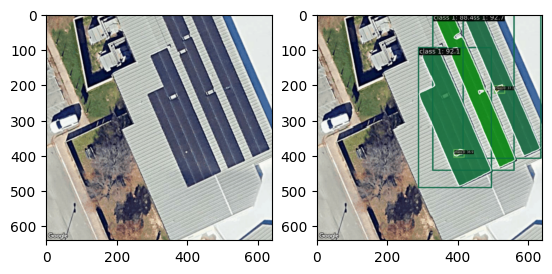

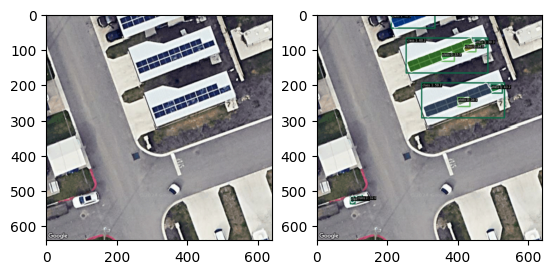

In [8]:
dmg_df = dmg_df[dmg_df['total_damage_amt']>0]
dmg_images = list(dmg_df['image'].drop_duplicates())
for img_path in dmg_images:
    img = mmcv.imread(img_path, channel_order='rgb')
    new_result = inference_detector(model, img)
    visualizer.add_datasample(
          img_path,
          img,
          data_sample=new_result,
          draw_gt=None,
          wait_time=0
          )
    img_infer = visualizer.get_image()
    # Create subplots to visualize the original image + inference image side-by-side
    plt.subplot(1, 2, 1)
    img_orig = mmcv.imread(img_path, channel_order='rgb')
    plt.imshow(img_orig)
    plt.subplot(1, 2, 2)
    plt.imshow(img_infer)
    plt.show()
    plt.close()